In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:

# Create a 3x3 image with 3 channels (RGB)
# Each pixel has values [R, G, B] → values range from 0 to 255
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],     # Red, Green, Blue
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],   # Yellow, Cyan, Magenta
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]] # Black, Gray, White
], dtype=np.uint8)

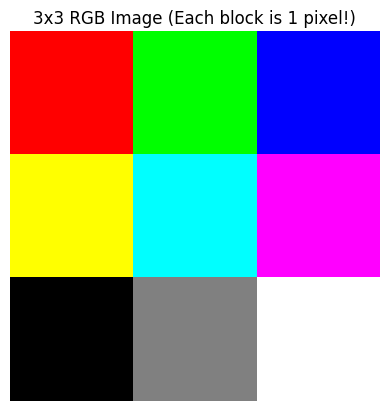

In [3]:

# Show the image
plt.imshow(image)
plt.title("3x3 RGB Image (Each block is 1 pixel!)")
plt.axis('off')  # Hide axis ticks
plt.show()


In [4]:
print("Pixel RGB values:")
for i in range(image.shape[0]):      # Rows
    for j in range(image.shape[1]):  # Columns
        pixel = image[i, j]
        print(f"Pixel at ({i}, {j}) → R: {pixel[0]}, G: {pixel[1]}, B: {pixel[2]}")

Pixel RGB values:
Pixel at (0, 0) → R: 255, G: 0, B: 0
Pixel at (0, 1) → R: 0, G: 255, B: 0
Pixel at (0, 2) → R: 0, G: 0, B: 255
Pixel at (1, 0) → R: 255, G: 255, B: 0
Pixel at (1, 1) → R: 0, G: 255, B: 255
Pixel at (1, 2) → R: 255, G: 0, B: 255
Pixel at (2, 0) → R: 0, G: 0, B: 0
Pixel at (2, 1) → R: 128, G: 128, B: 128
Pixel at (2, 2) → R: 255, G: 255, B: 255


In [5]:
zoom_factor = 100  # Bigger number = bigger pixels
image_big = np.kron(image, np.ones((zoom_factor, zoom_factor, 1), dtype=np.uint8))


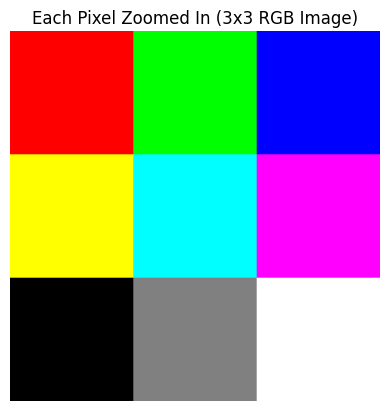

In [6]:
plt.imshow(image_big)
plt.title("Each Pixel Zoomed In (3x3 RGB Image)")
plt.axis('off')
plt.show()

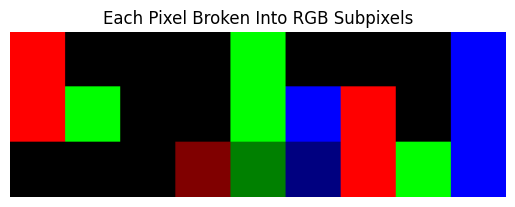

In [7]:
# New image shape: (3 rows, 3 cols * 3 subpixels, 3 channels)
subpixel_image = np.zeros((3, 3 * 3, 3), dtype=np.uint8)

# Fill in subpixel image
for i in range(3):         # rows
    for j in range(3):     # columns
        r, g, b = image[i, j]
        subpixel_image[i, j * 3 + 0] = [r, 0, 0]   # Red subpixel
        subpixel_image[i, j * 3 + 1] = [0, g, 0]   # Green subpixel
        subpixel_image[i, j * 3 + 2] = [0, 0, b]   # Blue subpixel

# Zoom it up for visibility
zoom = 100
subpixel_zoomed = np.kron(subpixel_image, np.ones((zoom, zoom, 1), dtype=np.uint8))

# Plot
plt.imshow(subpixel_zoomed)
plt.title("Each Pixel Broken Into RGB Subpixels")
plt.axis('off')
plt.show()

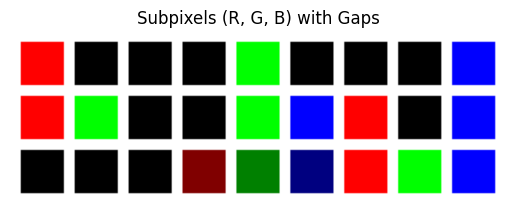

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Original 3x3 image
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]]
], dtype=np.uint8)

rows, cols, _ = image.shape

# Parameters
subpixel_size = 20        # Size of each subpixel block
gap = 5                   # Gap between subpixels

# Calculate canvas size
canvas_height = rows * subpixel_size + (rows + 1) * gap
canvas_width = cols * 3 * subpixel_size + (cols * 3 + 1) * gap

# Create blank white canvas
canvas = np.ones((canvas_height, canvas_width, 3), dtype=np.uint8) * 255

# Draw each subpixel with spacing
for i in range(rows):      # Row
    for j in range(cols):  # Column
        r, g, b = image[i, j]

        # Positions of subpixels
        for k, color in enumerate([[r, 0, 0], [0, g, 0], [0, 0, b]]):  # R, G, B
            top = i * (subpixel_size + gap) + gap
            left = (j * 3 + k) * (subpixel_size + gap) + gap
            canvas[top:top+subpixel_size, left:left+subpixel_size] = color

# Show the result
plt.imshow(canvas)
plt.title("Subpixels (R, G, B) with Gaps")
plt.axis('off')
plt.show()


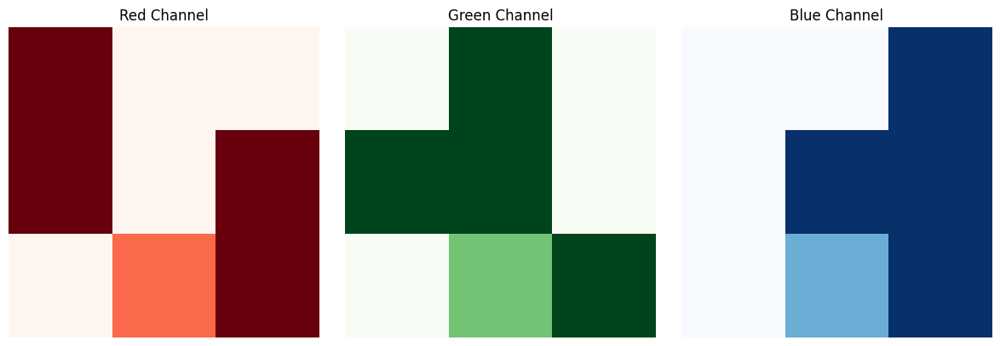

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# Your original 3x3 RGB image
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]]
], dtype=np.uint8)

# Split into R, G, B channels
red_channel   = image[:, :, 0]
green_channel = image[:, :, 1]
blue_channel  = image[:, :, 2]

# Plot each channel as a grayscale image
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].imshow(red_channel, cmap='Reds')
axs[0].set_title("Red Channel")
axs[0].axis('off')

axs[1].imshow(green_channel, cmap='Greens')
axs[1].set_title("Green Channel")
axs[1].axis('off')

axs[2].imshow(blue_channel, cmap='Blues')
axs[2].set_title("Blue Channel")
axs[2].axis('off')

plt.tight_layout()
plt.show()


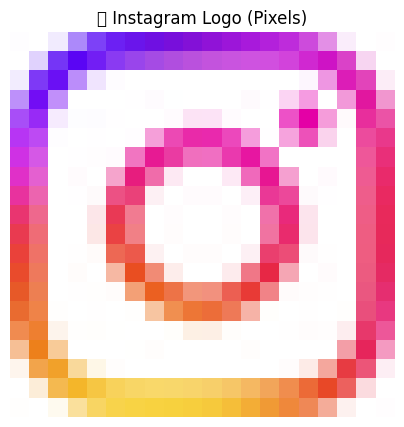

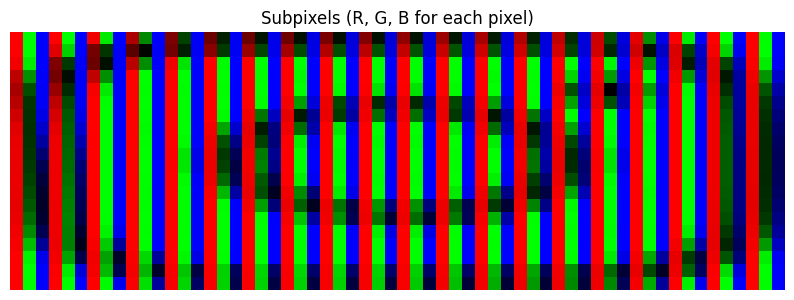

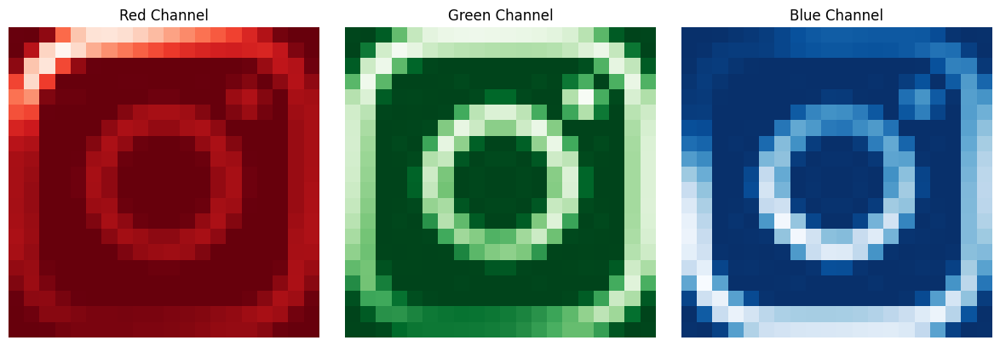

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# --- Step 1: Load and resize the image ---
image_path = "Instagram_Glyph_Gradient.png"  # Your image path
img = Image.open(image_path).convert("RGB")
img_small = img.resize((20, 20), Image.Resampling.LANCZOS)
img_array = np.array(img_small)

# --- Step 2: Visualize zoomed pixel image ---
plt.figure(figsize=(5, 5))
plt.imshow(img_array)
plt.title("🟦 Instagram Logo (Pixels)")
plt.axis('off')
plt.show()

# --- Step 3: Subpixel Visualization ---
rows, cols, _ = img_array.shape
subpixel_vis = np.zeros((rows, cols * 3, 3), dtype=np.uint8)

# Fill each section with R, G, B side-by-side
subpixel_vis[:, 0::3, 0] = img_array[:, :, 0]  # Red
subpixel_vis[:, 1::3, 1] = img_array[:, :, 1]  # Green
subpixel_vis[:, 2::3, 2] = img_array[:, :, 2]  # Blue

plt.figure(figsize=(10, 5))
plt.imshow(subpixel_vis)
plt.title("Subpixels (R, G, B for each pixel)")
plt.axis('off')
plt.show()

# --- Step 4: Visualize each channel separately ---
red_channel = img_array[:, :, 0]
green_channel = img_array[:, :, 1]
blue_channel = img_array[:, :, 2]

fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].imshow(red_channel, cmap='Reds')
axs[0].set_title("Red Channel")
axs[0].axis('off')

axs[1].imshow(green_channel, cmap='Greens')
axs[1].set_title("Green Channel")
axs[1].axis('off')

axs[2].imshow(blue_channel, cmap='Blues')
axs[2].set_title("Blue Channel")
axs[2].axis('off')

plt.tight_layout()
plt.show()


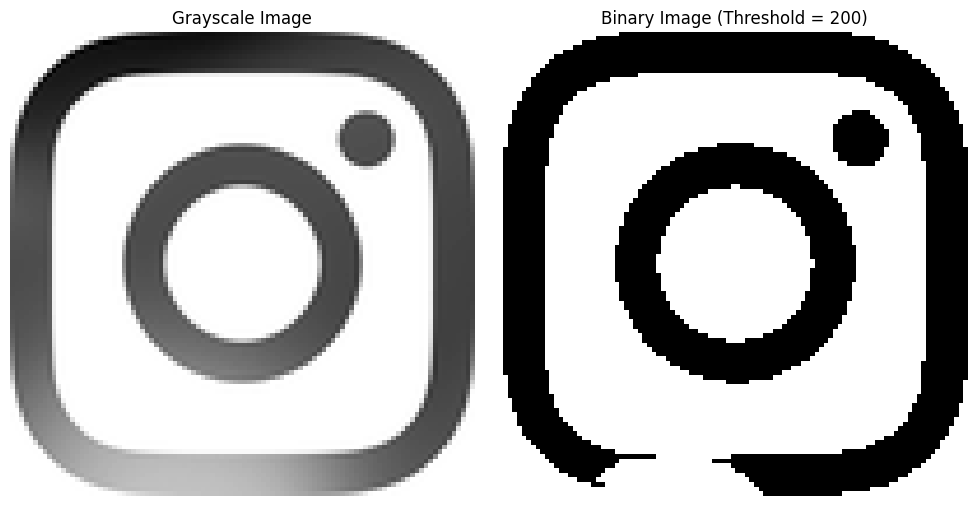

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load and convert image to grayscale
image_path = "Instagram_Glyph_Gradient.png"
img = Image.open(image_path).convert("L")  # "L" = grayscale

# Resize for simplicity
img_small = img.resize((100, 100), Image.Resampling.LANCZOS)
img_array = np.array(img_small)

# Apply threshold
threshold = 200
binary_image = np.where(img_array >= threshold, 255, 0).astype(np.uint8)

# Plot original grayscale and binary image
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].imshow(img_array, cmap='gray')
axs[0].set_title("Grayscale Image")
axs[0].axis('off')

axs[1].imshow(binary_image, cmap='gray')
axs[1].set_title("Binary Image (Threshold = 200)")
axs[1].axis('off')

plt.tight_layout()
plt.show()


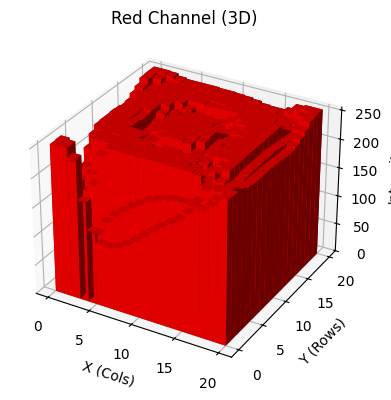

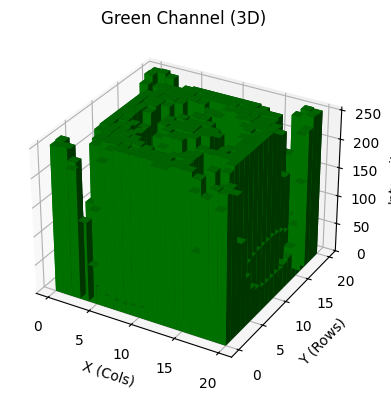

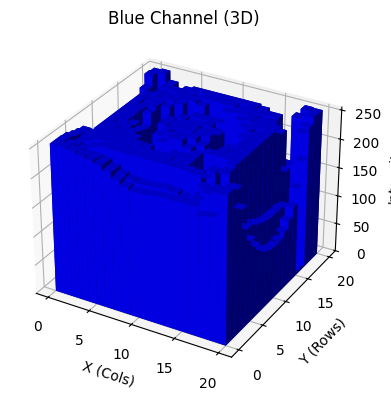

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from PIL import Image

# Load and resize image
image_path = "Instagram_Glyph_Gradient.png"
img = Image.open(image_path).convert("RGB")
img_small = img.resize((20, 20), Image.Resampling.LANCZOS)
img_array = np.array(img_small)

# Extract channels
red_channel = img_array[:, :, 0]
green_channel = img_array[:, :, 1]
blue_channel = img_array[:, :, 2]

# Helper function to plot 3D channel
def plot_channel_3d(channel, title, color):
    rows, cols = channel.shape
    x, y = np.meshgrid(np.arange(cols), np.arange(rows))
    z = channel

    fig = plt.figure(figsize=(6, 4))
    ax = fig.add_subplot(111, projection='3d')

    ax.bar3d(x.ravel(), y.ravel(), np.zeros_like(z).ravel(),
             dx=1, dy=1, dz=z.ravel(), color=color, shade=True)

    ax.set_title(f'{title} Channel (3D)')
    ax.set_zlim(0, 255)
    ax.set_xlabel("X (Cols)")
    ax.set_ylabel("Y (Rows)")
    ax.set_zlabel("Intensity")
    plt.tight_layout()
    plt.show()

# Plot all three RGB channels in 3D
plot_channel_3d(red_channel, "Red", "red")
plot_channel_3d(green_channel, "Green", "green")
plot_channel_3d(blue_channel, "Blue", "blue")


C:\Users\sajja\AppData\Local\Temp\ipykernel_18784\886616998.py:42: UserWarning: Glyph 129482 (\N{ICE CUBE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\sajja\Desktop\CVKN\.venv\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 129482 (\N{ICE CUBE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


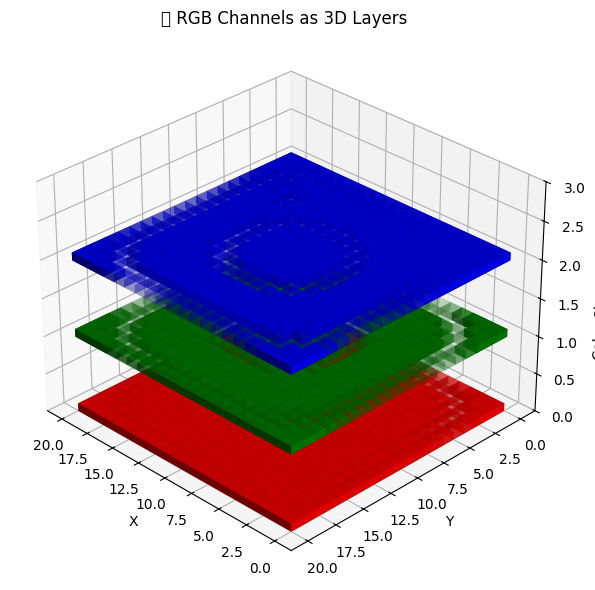

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load and resize the image
image_path = "Instagram_Glyph_Gradient.png"
img = Image.open(image_path).convert("RGB")
img = img.resize((20, 20), Image.Resampling.LANCZOS)
img_array = np.array(img)

rows, cols, _ = img_array.shape
x, y = np.meshgrid(np.arange(cols), np.arange(rows))

# Setup 3D plot
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=30, azim=135)

# Function to plot a color layer
def plot_layer(channel_data, z_offset, color):
    alpha = channel_data / 255.0  # Normalize for transparency
    for i in range(rows):
        for j in range(cols):
            ax.bar3d(j, i, z_offset, 1, 1, 0.1, color=color, alpha=alpha[i, j])

# Extract and plot each layer
red = img_array[:, :, 0]
green = img_array[:, :, 1]
blue = img_array[:, :, 2]

plot_layer(red, z_offset=0, color='red')
plot_layer(green, z_offset=1, color='green')
plot_layer(blue, z_offset=2, color='blue')

# Labels & limits
ax.set_zlim(0, 3)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Color Channel (Z)')
ax.set_title("🧊 RGB Channels as 3D Layers")

plt.tight_layout()
plt.show()


C:\Users\sajja\AppData\Local\Temp\ipykernel_18784\3469814541.py:52: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


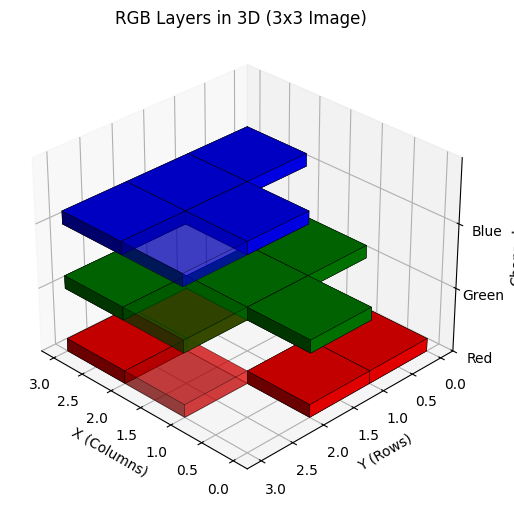

In [24]:
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D

# Your 3x3 RGB image
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]]
], dtype=np.uint8)

# Separate channels
r = image[:, :, 0]
g = image[:, :, 1]
b = image[:, :, 2]

rows, cols = r.shape

# Create meshgrid
x, y = np.meshgrid(np.arange(cols), np.arange(rows))

# Function to plot a 3D RGB layer
def plot_layer(ax, data, z_offset, color):
    alpha = data / 255.0
    for i in range(rows):
        for j in range(cols):
            ax.bar3d(j, i, z_offset, 1, 1, 0.2,
                     color=color,
                     alpha=alpha[i, j],
                     edgecolor='k', linewidth=0.3)

# 3D plot setup
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.view_init(elev=30, azim=135)

# Plot each channel at a different z level
plot_layer(ax, r, 0, 'red')
plot_layer(ax, g, 1, 'green')
plot_layer(ax, b, 2, 'blue')

# Labels
ax.set_zlim(0, 3)
ax.set_zticks([0, 1, 2])
ax.set_zticklabels(['Red', 'Green', 'Blue'])
ax.set_title("RGB Layers in 3D (3x3 Image)")
ax.set_xlabel("X (Columns)")
ax.set_ylabel("Y (Rows)")
ax.set_zlabel("Channel")

plt.tight_layout()
plt.show()


C:\Users\sajja\AppData\Local\Temp\ipykernel_18784\332529040.py:45: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


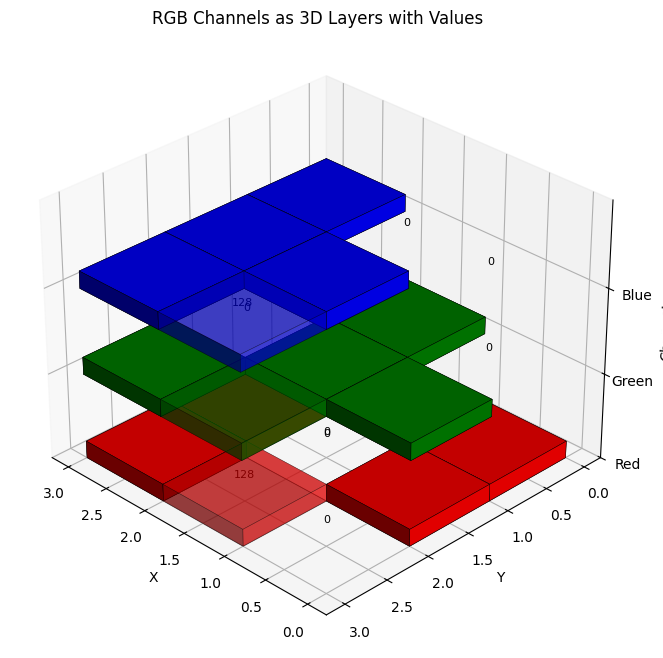

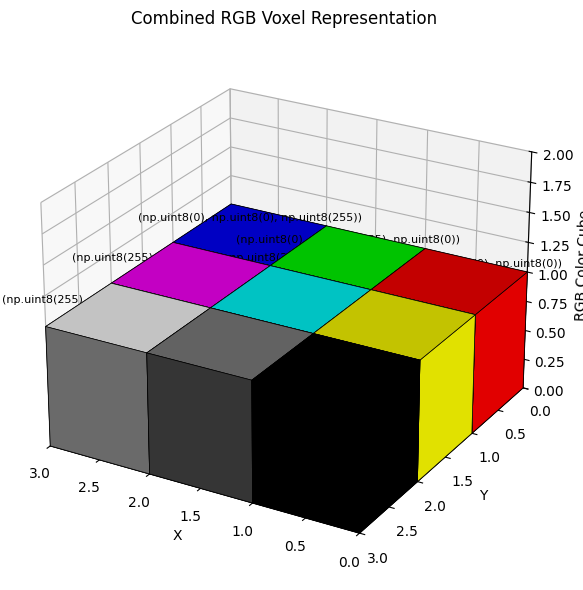

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation

# Define 3x3 RGB image
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]]
], dtype=np.uint8)

rows, cols = image.shape[:2]
r, g, b = image[:, :, 0], image[:, :, 1], image[:, :, 2]

x, y = np.meshgrid(np.arange(cols), np.arange(rows))

# --- 1. 3D RGB LAYERS with labels ---
def plot_rgb_layers(with_text=True):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(elev=30, azim=135)

    def plot_layer(data, z_offset, color_name):
        alpha = data / 255.0
        for i in range(rows):
            for j in range(cols):
                ax.bar3d(j, i, z_offset, 1, 1, 0.2,
                         color=color_name, alpha=alpha[i, j], edgecolor='k', linewidth=0.3)
                if with_text:
                    ax.text(j + 0.5, i + 0.5, z_offset + 0.25,
                            f"{data[i, j]}", ha='center', va='bottom', fontsize=8)

    plot_layer(r, 0, 'red')
    plot_layer(g, 1, 'green')
    plot_layer(b, 2, 'blue')

    ax.set_zlim(0, 3)
    ax.set_zticks([0, 1, 2])
    ax.set_zticklabels(['Red', 'Green', 'Blue'])
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Channel")
    ax.set_title("RGB Channels as 3D Layers with Values")
    plt.tight_layout()
    plt.show()

plot_rgb_layers()

# --- 2. Combined RGB Voxel Visualization ---
def plot_rgb_voxel_cube():
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(elev=25, azim=120)

    for i in range(rows):
        for j in range(cols):
            color = image[i, j] / 255  # Normalize
            ax.bar3d(j, i, 0, 1, 1, 1,
                     color=color, edgecolor='k', linewidth=0.5)
            ax.text(j + 0.5, i + 0.5, 1.1,
                    f"{tuple(image[i, j])}", ha='center', va='bottom', fontsize=8)

    ax.set_xlim(0, cols)
    ax.set_ylim(0, rows)
    ax.set_zlim(0, 2)
    ax.set_title("Combined RGB Voxel Representation")
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("RGB Color Cube")
    plt.tight_layout()
    plt.show()

plot_rgb_voxel_cube()

# --- 3. Animation of 3D RGB Layer Rotation ---
def animate_rgb_layers():
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')

    def plot_layers():
        ax.clear()
        def plot_layer(data, z_offset, color_name):
            alpha = data / 255.0
            for i in range(rows):
                for j in range(cols):
                    ax.bar3d(j, i, z_offset, 1, 1, 0.2,
                             color=color_name, alpha=alpha[i, j], edgecolor='k', linewidth=0.3)

        plot_layer(r, 0, 'red')
        plot_layer(g, 1, 'green')
        plot_layer(b, 2, 'blue')
        ax.set_zlim(0, 3)
        ax.set_axis_off()

    def update(frame):
        ax.view_init(elev=30, azim=frame)
        plot_layers()

    ani = animation.FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50)
    plt.close(fig)
    return ani

# Create and display animation in notebook (if running in Jupyter)
ani = animate_rgb_layers()

# To save:
ani.save("rgb_rotation.gif", writer='pillow', fps=20)

# If using Jupyter, display inline:
from IPython.display import HTML
HTML(ani.to_jshtml())


✅ GIF saved as 'rgb_layers_rotation.gif'


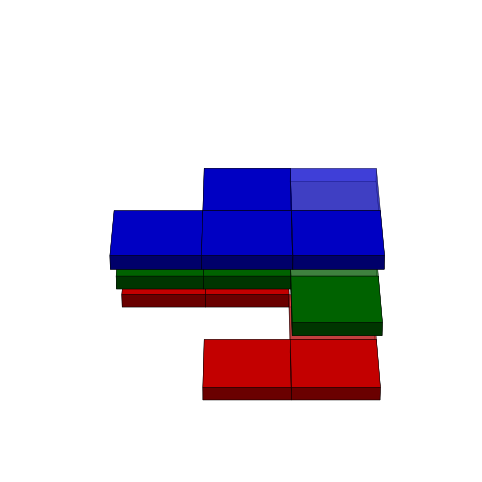

In [27]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from PIL import Image

# Your 3x3 RGB image
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]]
], dtype=np.uint8)

rows, cols = image.shape[:2]
r, g, b = image[:, :, 0], image[:, :, 1], image[:, :, 2]

# --- Function to Plot Layers ---
def plot_layers(ax):
    def plot_layer(data, z_offset, color_name):
        alpha = data / 255.0
        for i in range(rows):
            for j in range(cols):
                ax.bar3d(j, i, z_offset, 1, 1, 0.2,
                         color=color_name, alpha=alpha[i, j], edgecolor='k', linewidth=0.3)

    plot_layer(r, 0, 'red')
    plot_layer(g, 1, 'green')
    plot_layer(b, 2, 'blue')

# --- Animation Setup ---
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

def update(frame):
    ax.cla()  # Clear the plot
    ax.view_init(elev=30, azim=frame)  # Rotate the view
    plot_layers(ax)
    ax.set_zlim(0, 3)
    ax.set_axis_off()

ani = animation.FuncAnimation(fig, update, frames=np.arange(0, 360, 2), interval=50)

# --- Save the animation as a GIF ---
ani.save("rgb_layers_rotation.gif", writer='pillow', fps=20)

print("✅ GIF saved as 'rgb_layers_rotation.gif'")


In [28]:
from IPython.display import Image as IPyImage, display

# Save the animation
ani.save("rgb_layers_rotation.gif", writer='pillow', fps=20)

# Display the saved GIF inline
display(IPyImage(filename="rgb_layers_rotation.gif"))


KeyboardInterrupt: 

In [29]:
from IPython.display import HTML

HTML(ani.to_jshtml())


In [2]:
import numpy as np
import plotly.graph_objects as go

# RGB image: 3x3, each pixel has R, G, B
image = np.array([
    [[255, 0, 0],   [0, 255, 0],   [0, 0, 255]],
    [[255, 255, 0], [0, 255, 255], [255, 0, 255]],
    [[0, 0, 0],     [128, 128, 128], [255, 255, 255]]
], dtype=np.uint8)

rows, cols = image.shape[:2]
r, g, b = image[:, :, 0], image[:, :, 1], image[:, :, 2]

fig = go.Figure()

# Function to draw one RGB cube (a 3D block)
def draw_cube(x, y, z, size, color):
    # 8 vertices of a cube
    x0, y0, z0 = x, y, z
    x1, y1, z1 = x + size, y + size, z + size
    vertices = np.array([
        [x0, y0, z0], [x1, y0, z0], [x1, y1, z0], [x0, y1, z0],
        [x0, y0, z1], [x1, y0, z1], [x1, y1, z1], [x0, y1, z1],
    ])
    # Triangles to form cube faces
    faces = np.array([
        [0, 1, 2], [0, 2, 3],  # bottom
        [4, 5, 6], [4, 6, 7],  # top
        [0, 1, 5], [0, 5, 4],  # front
        [1, 2, 6], [1, 6, 5],  # right
        [2, 3, 7], [2, 7, 6],  # back
        [3, 0, 4], [3, 4, 7],  # left
    ])
    x_vals, y_vals, z_vals = vertices[:, 0], vertices[:, 1], vertices[:, 2]
    i, j, k = faces[:, 0], faces[:, 1], faces[:, 2]

    fig.add_trace(go.Mesh3d(
        x=x_vals, y=y_vals, z=z_vals,
        i=i, j=j, k=k,
        color=color,
        opacity=1.0,
        flatshading=True,
        showscale=False
    ))

# Plot cubes for each R, G, B subpixel in Z-layers
for i in range(rows):
    for j in range(cols):
        if r[i, j] > 0:
            draw_cube(j, -i, 0, 0.9, f'rgb({r[i,j]},0,0)')
        if g[i, j] > 0:
            draw_cube(j, -i, 1.1, 0.9, f'rgb(0,{g[i,j]},0)')
        if b[i, j] > 0:
            draw_cube(j, -i, 2.2, 0.9, f'rgb(0,0,{b[i,j]})')

# Layout for nice 3D interaction
fig.update_layout(
    scene=dict(
        xaxis=dict(title='Pixel X', backgroundcolor='white', showgrid=False),
        yaxis=dict(title='Pixel Y', backgroundcolor='white', showgrid=False),
        zaxis=dict(title='Channel Z', backgroundcolor='white', showgrid=False,
                   tickvals=[0, 1.1, 2.2], ticktext=['Red', 'Green', 'Blue']),
        aspectratio=dict(x=1, y=1, z=0.6),
    ),
    title="🧱 Interactive RGB Subpixels as 3D Cubes (Drag to Rotate)",
    margin=dict(l=0, r=0, t=40, b=0)
)

fig.show()
